### task 1

In [ ]:
import os
import gzip
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import requests
import shutil

# 1. Downloading the dataset from GitHub
DATA_DIR = './fashion_mnist_data'

def download_and_extract(url, filename):
    """Downloads and extracts the Fashion MNIST files from GitHub."""
    file_path = os.path.join(DATA_DIR, filename)
    if not os.path.exists(DATA_DIR):
        os.makedirs(DATA_DIR)

    if not os.path.exists(file_path):
        print(f"Downloading {filename}...")
        response = requests.get(url, stream=True)
        with open(file_path, 'wb') as f:
            shutil.copyfileobj(response.raw, f)
        print(f"Download complete: {filename}")
    else:
        print(f"{filename} already exists.")

def extract_gz(file_name):
    """Extracts the .gz file and returns the byte data."""
    with gzip.open(file_name, 'rb') as f:
        return np.frombuffer(f.read(), dtype=np.uint8)

# URLs for the Fashion MNIST dataset
urls = {
    "train_images": "https://github.com/zalandoresearch/fashion-mnist/raw/master/data/fashion/train-images-idx3-ubyte.gz",
    "train_labels": "https://github.com/zalandoresearch/fashion-mnist/raw/master/data/fashion/train-labels-idx1-ubyte.gz",
    "test_images": "https://github.com/zalandoresearch/fashion-mnist/raw/master/data/fashion/t10k-images-idx3-ubyte.gz",
    "test_labels": "https://github.com/zalandoresearch/fashion-mnist/raw/master/data/fashion/t10k-labels-idx1-ubyte.gz"
}

In [ ]:
# Download the dataset files
for key, url in urls.items():
    filename = url.split("/")[-1]
    download_and_extract(url, filename)

Download complete: train-images-idx3-ubyte.gz
Download complete: train-labels-idx1-ubyte.gz
Download complete: t10k-images-idx3-ubyte.gz
Download complete: t10k-labels-idx1-ubyte.gz


In [ ]:
def load_mnist_images(file_path):
    """Load MNIST image files (28x28 pixels, grayscale) from the binary file."""
    data = extract_gz(file_path)
    num_images = data.shape[0] // (28 * 28)
    images = data[16:].reshape(num_images, 28, 28).astype(np.float32) / 255.0  # Normalize to [0, 1]
    return images

def load_mnist_labels(file_path):
    """Load MNIST label files."""
    data = extract_gz(file_path)
    labels = data[8:].astype(np.int64)
    return labels

# Paths for the downloaded files
train_images_path = os.path.join(DATA_DIR, "train-images-idx3-ubyte.gz")
train_labels_path = os.path.join(DATA_DIR, "train-labels-idx1-ubyte.gz")
test_images_path = os.path.join(DATA_DIR, "t10k-images-idx3-ubyte.gz")
test_labels_path = os.path.join(DATA_DIR, "t10k-labels-idx1-ubyte.gz")

# Load the training and test datasets
train_images = load_mnist_images(train_images_path)
train_labels = load_mnist_labels(train_labels_path)
test_images = load_mnist_images(test_images_path)
test_labels = load_mnist_labels(test_labels_path)

In [ ]:
class FashionMNISTDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = torch.tensor(images, dtype=torch.float32)
        self.labels = torch.tensor(labels, dtype=torch.int64)
        self.transform = transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

# 4. DataLoader

train_dataset = FashionMNISTDataset(train_images, train_labels)
test_dataset = FashionMNISTDataset(test_images, test_labels)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# 5. Model, training, and evaluation (same as before)

class FashionMNISTModel(nn.Module):
    def __init__(self):
        super(FashionMNISTModel, self).__init__()
        self.fc1 = nn.Linear(28 * 28, 256)
        self.fc2 = nn.Linear(256, 128)
        self.fc3 = nn.Linear(128, 10)

    def forward(self, x):
        x = x.view(-1, 28 * 28)  # Flatten image into a vector
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)  # Output without softmax
        return x

# Initialize Model, Loss, and Optimizer
model = FashionMNISTModel()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training function
def train_model(model, train_loader, criterion, optimizer, num_epochs=5):
    for epoch in range(num_epochs):
        running_loss = 0.0
        for images, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}")

# Testing function
def test_model(model, test_loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    accuracy = 100 * correct / total
    print(f"Test Accuracy: {accuracy:.2f}%")


In [ ]:
train_model(model, train_loader, criterion, optimizer, num_epochs=5)
test_model(model, test_loader)

Epoch [1/5], Loss: 0.5250
Epoch [2/5], Loss: 0.3722
Epoch [3/5], Loss: 0.3322
Epoch [4/5], Loss: 0.3077
Epoch [5/5], Loss: 0.2895
Test Accuracy: 87.21%


### task 2:

In [ ]:
from torchvision import datasets
from torchvision import transforms
import matplotlib.pyplot as plt

In [ ]:
tensor_transform = transforms.ToTensor()

# Download the MNIST Dataset
dataset = datasets.MNIST(root = "./data/fashion",
                         train = True,
                         download = True,
                         transform = tensor_transform)

# DataLoader is used to load the dataset
# for training
loader = torch.utils.data.DataLoader(dataset = dataset,
                                     batch_size = 32,
                                     shuffle = True)

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 9912422/9912422 [00:00<00:00, 16047670.61it/s]


Extracting ./data/fashion/MNIST/raw/train-images-idx3-ubyte.gz to ./data/fashion/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 28881/28881 [00:00<00:00, 480968.22it/s]


Extracting ./data/fashion/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/fashion/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 1648877/1648877 [00:00<00:00, 3830037.69it/s]


Extracting ./data/fashion/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/fashion/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 4542/4542 [00:00<00:00, 2720726.76it/s]

Extracting ./data/fashion/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/fashion/MNIST/raw



In [ ]:
class AE(torch.nn.Module):
	def __init__(self):
		super().__init__()

		self.encoder = torch.nn.Sequential(
			torch.nn.Linear(28 * 28, 128),
			torch.nn.ReLU(),
			torch.nn.Linear(128, 64),
			torch.nn.ReLU(),
			torch.nn.Linear(64, 36),
			torch.nn.ReLU(),
			torch.nn.Linear(36, 18),
			torch.nn.ReLU(),
			torch.nn.Linear(18, 9)
		)


		self.decoder = torch.nn.Sequential(
			torch.nn.Linear(9, 18),
			torch.nn.ReLU(),
			torch.nn.Linear(18, 36),
			torch.nn.ReLU(),
			torch.nn.Linear(36, 64),
			torch.nn.ReLU(),
			torch.nn.Linear(64, 128),
			torch.nn.ReLU(),
			torch.nn.Linear(128, 28 * 28),
			torch.nn.Sigmoid()
		)

	def forward(self, x):
		encoded = self.encoder(x)
		decoded = self.decoder(encoded)
		return decoded


In [ ]:
# Model Initialization
model = AE()

# Validation using MSE Loss function
loss_function = torch.nn.MSELoss()

# Using an Adam Optimizer with lr = 0.1
optimizer = torch.optim.Adam(model.parameters(),
							lr = 1e-1,
							weight_decay = 1e-8)

Start epoch: 0
End epoch: 0
Start epoch: 1
End epoch: 1
Start epoch: 2
End epoch: 2
Start epoch: 3
End epoch: 3
Start epoch: 4
End epoch: 4


RuntimeError: Can't call numpy() on Tensor that requires grad. Use tensor.detach().numpy() instead.

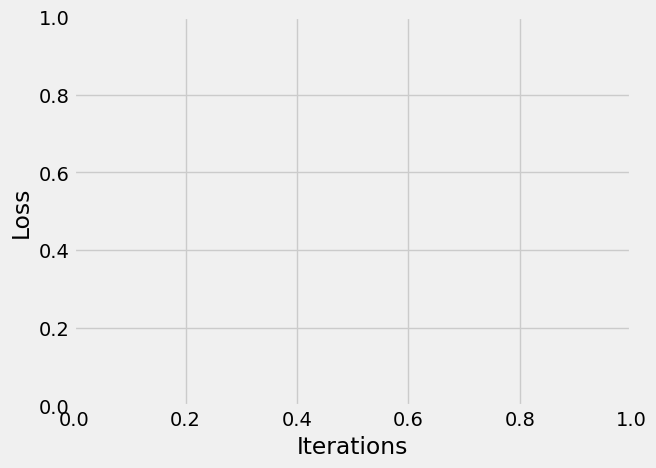

In [ ]:
epochs = 5
outputs = []
losses = []
for epoch in range(epochs):
  print("Start epoch:", epoch)
  for (image, _) in loader:

    # Reshaping the image to (-1, 784)
    image = image.reshape(-1, 28*28)

    # Output of Autoencoder
    reconstructed = model(image)

    # Calculating the loss function
    loss = loss_function(reconstructed, image)

    # The gradients are set to zero,
    # the gradient is computed and stored.
    # .step() performs parameter update
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    # Storing the losses in a list for plotting
    losses.append(loss)
  print("End epoch:", epoch)
  outputs.append((epochs, image, reconstructed))

# Defining the Plot Style



AttributeError: 'list' object has no attribute 'detach'

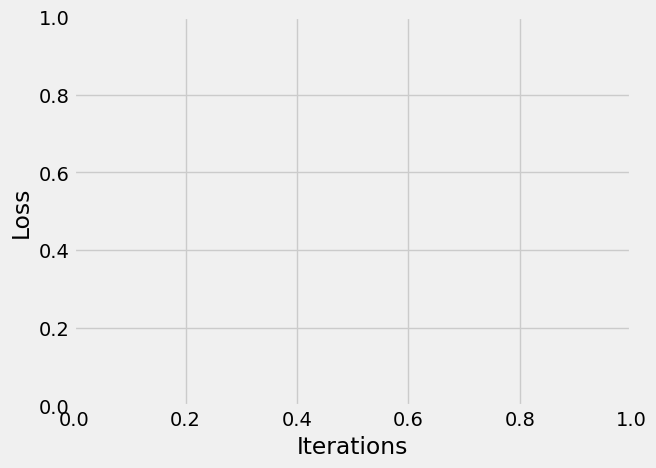

In [ ]:
plt.style.use('fivethirtyeight')
plt.xlabel('Iterations')
plt.ylabel('Loss')

# Plotting the last 100 values
plt.plot(losses[-100:])

In [ ]:
for i, item in enumerate(image):

  # Reshape the array for plotting
  item = item.reshape(-1, 28, 28)
  plt.imshow(item[0])

  for i, item in enumerate(reconstructed):
  item = item.reshape(-1, 28, 28)
  plt.imshow(item[0])


### task 3

In [ ]:
import torch
import torchaudio

print(torch.__version__)
print(torchaudio.__version__)

torch.random.manual_seed(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(device)

2.4.1+cu121
2.4.1+cu121
cuda


In [ ]:
import IPython
import matplotlib.pyplot as plt
from torchaudio.utils import download_asset
from google.colab import files

SPEECH_FILE = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")
#SPEECH_FILE = files.upload()

100%|██████████| 106k/106k [00:00<00:00, 29.0MB/s]


In [ ]:
bundle = torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H

print("Sample Rate:", bundle.sample_rate)

print("Labels:", bundle.get_labels())

Sample Rate: 16000
Labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


In [ ]:
model = bundle.get_model().to(device)

print(model.__class__)

<class 'torchaudio.models.wav2vec2.model.Wav2Vec2Model'>


In [ ]:
IPython.display.Audio(filename="[VINE] Why are you gay.wav", rate = 48000)

In [ ]:
#waveform, sample_rate = torchaudio.load(SPEECH_FILE)
waveform, sample_rate = torchaudio.load(filename="[VINE] Why are you gay.wav", rate = 48000)
waveform = waveform.to(device)

if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

TypeError: get_load_func.<locals>.load() got an unexpected keyword argument 'filename'

In [ ]:
with torch.inference_mode():
    features, _ = model.extract_features(waveform)

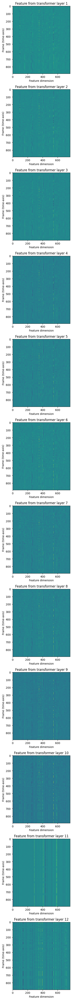

In [ ]:
fig, ax = plt.subplots(len(features), 1, figsize=(16, 4.3 * len(features)))
for i, feats in enumerate(features):
    ax[i].imshow(feats[0].cpu(), interpolation="nearest")
    ax[i].set_title(f"Feature from transformer layer {i+1}")
    ax[i].set_xlabel("Feature dimension")
    ax[i].set_ylabel("Frame (time-axis)")
fig.tight_layout()

In [ ]:
with torch.inference_mode():
    emission, _ = model(waveform)

Class labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


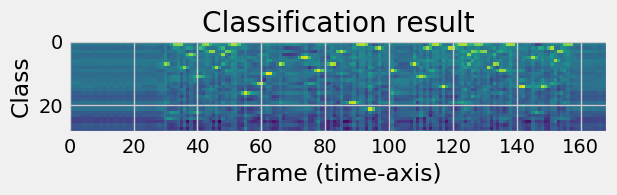

In [ ]:
plt.imshow(emission[0].cpu().T, interpolation="nearest")
plt.title("Classification result")
plt.xlabel("Frame (time-axis)")
plt.ylabel("Class")
plt.tight_layout()
print("Class labels:", bundle.get_labels())

In [ ]:
class GreedyCTCDecoder(torch.nn.Module):
    def __init__(self, labels, blank=0):
        super().__init__()
        self.labels = labels
        self.blank = blank

    def forward(self, emission: torch.Tensor) -> str:
        """Given a sequence emission over labels, get the best path string
        Args:
          emission (Tensor): Logit tensors. Shape `[num_seq, num_label]`.

        Returns:
          str: The resulting transcript
        """
        indices = torch.argmax(emission, dim=-1)  # [num_seq,]
        indices = torch.unique_consecutive(indices, dim=-1)
        indices = [i for i in indices if i != self.blank]
        return "".join([self.labels[i] for i in indices])

In [ ]:
decoder = GreedyCTCDecoder(labels=bundle.get_labels())
transcript = decoder(emission[0])

In [ ]:
print(transcript)
IPython.display.Audio(SPEECH_FILE)

WE|BRING|IN|THE|STUDIO|THIS|MORNING|ONE|OF|THE|GAT|RIHTS|ACTIVES|MISTER|SHOULD|I|CALL|YOU|MISTER|I|PAY|JULIAN|ONZIMA|THANK|YOU|FOR|COMING|IN|THINKYI|F|GOOD|MORNING|ONING|DEED|WHY|ARE|YOU|GI|WHO|SAYS|AMGY|YOU|UGY|
